# Importing the dataset and libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip '/content/drive/MyDrive/Datasets/captcha.zip' -d '/content'

Archive:  /content/drive/MyDrive/Datasets/captcha.zip
  inflating: /content/samples/226md.png  
  inflating: /content/samples/22d5n.png  
  inflating: /content/samples/2356g.png  
  inflating: /content/samples/23mdg.png  
  inflating: /content/samples/23n88.png  
  inflating: /content/samples/243mm.png  
  inflating: /content/samples/244e2.png  
  inflating: /content/samples/245y5.png  
  inflating: /content/samples/24f6w.png  
  inflating: /content/samples/24pew.png  
  inflating: /content/samples/25257.png  
  inflating: /content/samples/253dc.png  
  inflating: /content/samples/25egp.png  
  inflating: /content/samples/25m6p.png  
  inflating: /content/samples/25p2m.png  
  inflating: /content/samples/25w53.png  
  inflating: /content/samples/264m5.png  
  inflating: /content/samples/268g2.png  
  inflating: /content/samples/28348.png  
  inflating: /content/samples/28x47.png  
  inflating: /content/samples/2b827.png  
  inflating: /content/samples/2bg48.png  
  inflating: /content/

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
from tensorflow.keras.regularizers import *
from PIL import Image
import cv2
import os

# Data Preprocessing

In [ ]:
captchaImgShape = (50, 200, 1)
numSamples = len(os.listdir('samples/samples/'))
captchaLength = 5
print(captchaImgShape)
print(numSamples)

(50, 200, 1)
1070


In [ ]:
# Finding out the characters present in captcha images
captchaCharacters = {}
for i, img in enumerate(os.listdir('samples/samples/')):
  imgName = img.split('.')[0]
  for character in imgName:
    if character not in captchaCharacters.keys():
      captchaCharacters[character] = 1
    else:
      captchaCharacters[character] += 1
for character, frequency in zip(captchaCharacters.keys(), captchaCharacters.values()):
  print(f'Character : {character}, Frequency : {frequency}')
numSymbols = len(captchaCharacters.keys())
print(f'\nNumber of Unique Symbols : {numSymbols}')

Character : 8, Frequency : 272
Character : n, Frequency : 540
Character : 7, Frequency : 262
Character : 3, Frequency : 271
Character : 2, Frequency : 270
Character : 6, Frequency : 267
Character : 5, Frequency : 288
Character : y, Frequency : 240
Character : d, Frequency : 269
Character : c, Frequency : 276
Character : x, Frequency : 271
Character : f, Frequency : 277
Character : p, Frequency : 259
Character : g, Frequency : 281
Character : 4, Frequency : 289
Character : b, Frequency : 247
Character : w, Frequency : 244
Character : e, Frequency : 245
Character : m, Frequency : 282

Number of Unique Symbols : 19


In [ ]:
X = np.zeros((numSamples, 50, 200, 1))
y = np.zeros((captchaLength, numSamples, numSymbols))
for i, img in enumerate(os.listdir('samples/samples/')):
  captchaImg = cv2.imread('samples/samples/'+img, cv2.IMREAD_GRAYSCALE)
  captchaImg = captchaImg/255.0
  captchaImg = np.reshape(captchaImg, captchaImgShape)
  X[i] = captchaImg
  currentName = np.zeros((captchaLength, numSymbols))
  captchaName = img.split('.')[0]
  for j, character in enumerate(captchaName):
    currentName[j, list(captchaCharacters.keys()).index(character)] = 1
  y[:, i] = currentName

In [ ]:
print(X.shape)
print(y.shape)

(1070, 50, 200, 1)
(5, 1070, 19)


# Creating Testing and Training Data

In [ ]:
numTrainingSamples = int(numSamples*0.8)
numTestingSamples = int(numSamples - numTrainingSamples)
print(numTrainingSamples)
print(numTestingSamples)

856
214


In [ ]:
X_train = X[:numTrainingSamples]
y_train = y[:, :numTrainingSamples]
X_test = X[numTrainingSamples:]
y_test = y[:, numTrainingSamples:]

# Convolutional Neural Network Model

In [ ]:
input = Input(shape=captchaImgShape)

conv0 = Conv2D(16, activation='relu', kernel_size=5, strides=1, padding="same")(input)
maxpool0 = MaxPool2D(pool_size=(2, 2), padding='same')(conv0)

conv1 = Conv2D(32, activation='relu', kernel_size=3, strides=1, padding="same")(maxpool0)
maxpool1 = MaxPool2D(pool_size=(2, 2), padding='same')(conv1)

conv2 = Conv2D(64, activation='relu', kernel_size=3, strides=1, padding="same")(maxpool1)
maxpool2 = MaxPool2D(pool_size=(2, 2), padding='same')(conv2)

conv3 = Conv2D(128, activation='relu', kernel_size=3, strides=1, padding="same")(maxpool2)
maxpool3 = MaxPool2D(pool_size=(2, 2), padding='same')(conv3)

conv4 = Conv2D(256, activation='relu', kernel_size=3, strides=1, padding="same")(maxpool3)
maxpool4 = MaxPool2D(pool_size=(2, 2), padding='same')(conv4)

flat = Flatten()(maxpool4)
dropout = Dropout(0.5)(flat)
batchnorm = BatchNormalization()(dropout)

dense1 = Dense(64, activation='relu')(batchnorm)
dropout1 = Dropout(0.5)(dense1)
batchnorm1 = BatchNormalization()(dropout1)
output1 = Dense(numSymbols , activation='sigmoid' , name='character1')(batchnorm1)

dense2 = Dense(64, activation='relu')(batchnorm)
dropout2 = Dropout(0.5)(dense2)
batchnorm2 = BatchNormalization()(dropout2)
output2 = Dense(numSymbols , activation='sigmoid' , name='character2')(batchnorm2)

dense3 = Dense(64, activation='relu')(batchnorm)
dropout3 = Dropout(0.5)(dense3)
batchnorm3 = BatchNormalization()(dropout3)
output3 = Dense(numSymbols , activation='sigmoid' , name='character3')(batchnorm3)

dense4 = Dense(64, activation='relu')(batchnorm)
dropout4 = Dropout(0.5)(dense4)
batchnorm4 = BatchNormalization()(dropout4)
output4 = Dense(numSymbols , activation='sigmoid' , name='character4')(batchnorm4)

dense5 = Dense(64, activation='relu')(batchnorm)
dropout5 = Dropout(0.5)(dense5)
batchnorm5 = BatchNormalization()(dropout5)
output5 = Dense(numSymbols , activation='sigmoid' , name='character5')(batchnorm5)

output = [output1, output2, output3, output4, output5]

model = Model(inputs=input, outputs=output, name="captcha-recognition-cnn-model")

In [ ]:
model.summary()

Model: "captcha-recognition-cnn-model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 50, 200, 1)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d (Conv2D)                (None, 50, 200, 16)  416         ['input_1[0][0]']                
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 25, 100, 16)  0           ['conv2d[0][0]']                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 25, 100, 32)  4640        ['max

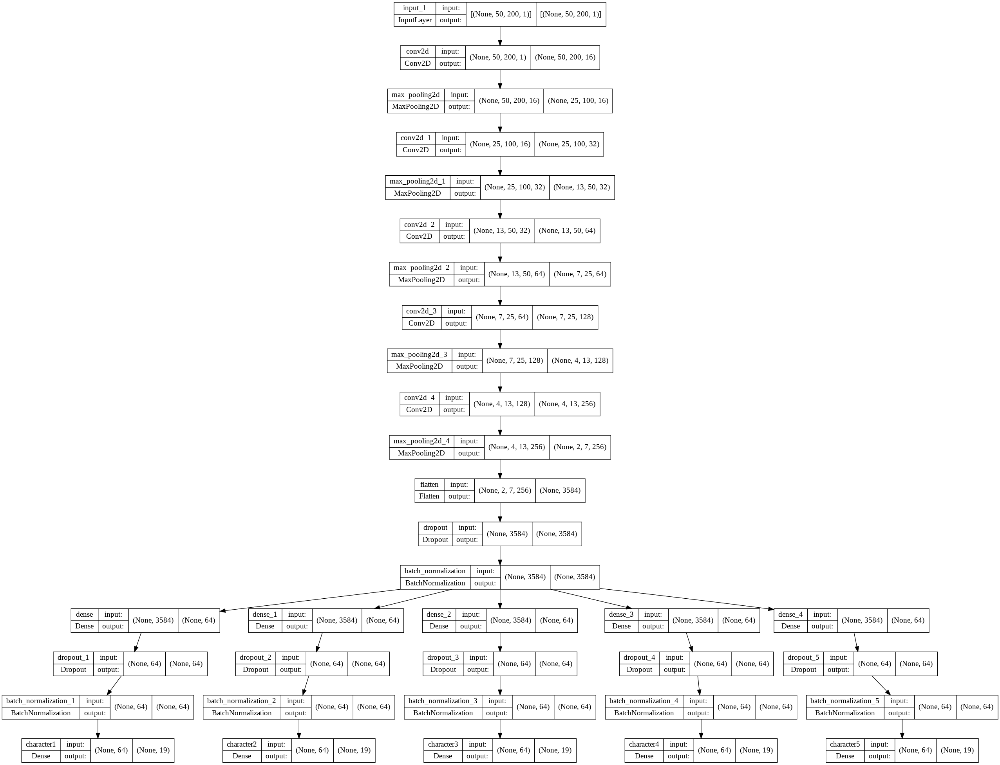

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True)

In [ ]:
modelLoss = 'categorical_crossentropy'
modelMetrics= ['accuracy']
modelOptimizer= 'adam'
model.compile(loss=modelLoss, metrics=modelMetrics, optimizer=modelOptimizer)

# Training the Model

In [ ]:
model.fit(X_train, [y_train[0], y_train[1], y_train[2], y_train[3], y_train[4]], epochs = 500, batch_size = 32)

Epoch 1/500
27/27 [==============================] - 15s 26ms/step - loss: 17.9959 - character1_loss: 3.5531 - character2_loss: 3.6456 - character3_loss: 3.6532 - character4_loss: 3.5618 - character5_loss: 3.5823 - character1_accuracy: 0.0596 - character2_accuracy: 0.0537 - character3_accuracy: 0.0572 - character4_accuracy: 0.0643 - character5_accuracy: 0.0467
Epoch 2/500
27/27 [==============================] - 0s 17ms/step - loss: 17.6611 - character1_loss: 3.5176 - character2_loss: 3.5665 - character3_loss: 3.5565 - character4_loss: 3.5013 - character5_loss: 3.5192 - character1_accuracy: 0.0631 - character2_accuracy: 0.0596 - character3_accuracy: 0.0479 - character4_accuracy: 0.0619 - character5_accuracy: 0.0584
Epoch 3/500
27/27 [==============================] - 0s 17ms/step - loss: 17.5230 - character1_loss: 3.4360 - character2_loss: 3.5253 - character3_loss: 3.5444 - character4_loss: 3.5011 - character5_loss: 3.5162 - character1_accuracy: 0.0631 - character2_accuracy: 0.0514 - c

# Testing the Model

In [ ]:
modelEvaluation = model.evaluate(X_test, [y_test[0], y_test[1], y_test[2], y_test[3], y_test[4]])

7/7 [==============================] - 1s 34ms/step - loss: 0.4033 - character1_loss: 0.1258 - character2_loss: 0.0139 - character3_loss: 0.1604 - character4_loss: 0.0683 - character5_loss: 0.0349 - character1_accuracy: 0.9953 - character2_accuracy: 0.9907 - character3_accuracy: 0.9673 - character4_accuracy: 0.9907 - character5_accuracy: 0.9953


In [ ]:
print(modelEvaluation)

[0.40334397554397583, 0.12580333650112152, 0.01394830271601677, 0.16042056679725647, 0.06825253367424011, 0.03491927310824394, 0.9953271150588989, 0.9906542301177979, 0.9672897458076477, 0.9906542301177979, 0.9953271150588989]


In [ ]:
print(f'Character - 1 Accuracy : {modelEvaluation[6]*100} %')
print(f'Character - 2 Accuracy : {modelEvaluation[7]*100} %')
print(f'Character - 3 Accuracy : {modelEvaluation[8]*100} %')
print(f'Character - 4 Accuracy : {modelEvaluation[9]*100} %')
print(f'Character - 5 Accuracy : {modelEvaluation[10]*100} %')

Character - 1 Accuracy : 99.53271150588989 %
Character - 2 Accuracy : 99.06542301177979 %
Character - 3 Accuracy : 96.72897458076477 %
Character - 4 Accuracy : 99.06542301177979 %
Character - 5 Accuracy : 99.53271150588989 %


In [ ]:
characters = list(captchaCharacters.keys())
predictedCaptchaText = []
testCaptchaText = []

for i, xt in enumerate(X_test):
  xt = np.reshape(X_test[i] , (1, 50,200,1))
  yp = model.predict(xt)
  yp = np.reshape(yp ,(5, numSymbols))
  pct = ''.join([characters[np.argmax(i)] for i in yp])
  predictedCaptchaText.append(pct)

for i in range(0, numTestingSamples):
  tct = ''.join([characters[i] for i in (np.argmax(y_test[:, i],axis=1))])
  testCaptchaText.append(tct)

In [ ]:
print(predictedCaptchaText[8])
print(testCaptchaText[8])

ymp7g
ymp7g


In [ ]:
correctPredictions = 0
wrongPredictions = 0
for i in range(0, len(predictedCaptchaText)):
  if predictedCaptchaText[i]==testCaptchaText[i]:
    correctPredictions+=1
  else:
    wrongPredictions+=1
print(f'Correct Predictions : {correctPredictions}\nWrong Predictions : {wrongPredictions}')
print(f'Accuracy : {correctPredictions*100/(correctPredictions+wrongPredictions)} %')

Correct Predictions : 203
Wrong Predictions : 11
Accuracy : 94.85981308411215 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


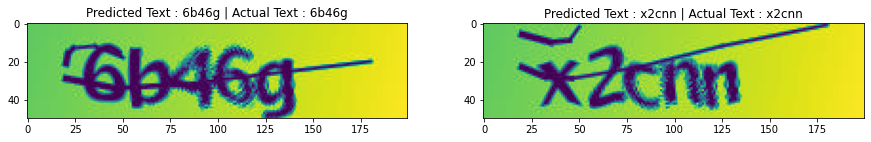

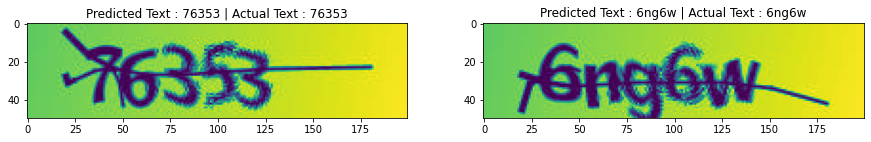

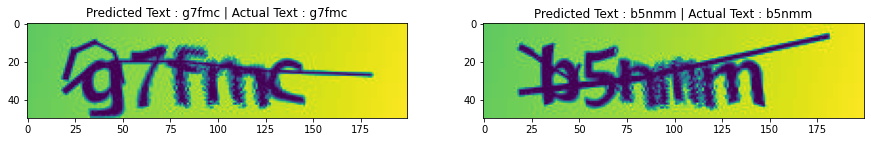

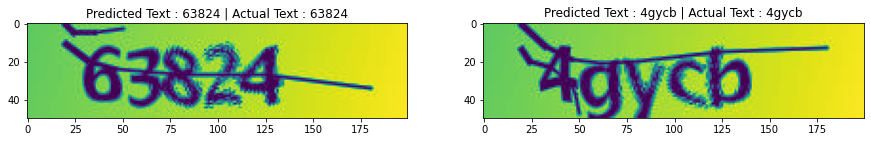

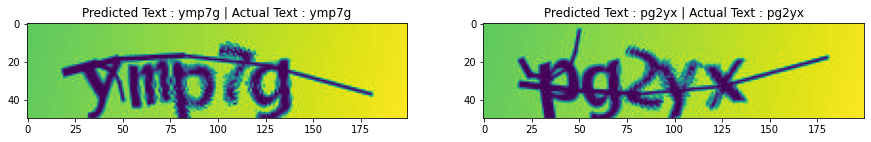

...

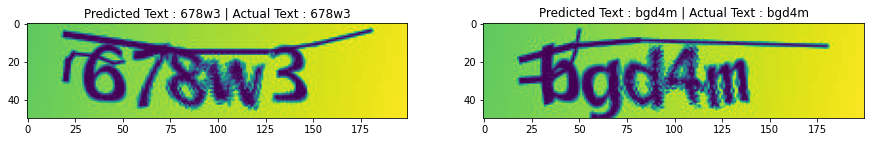

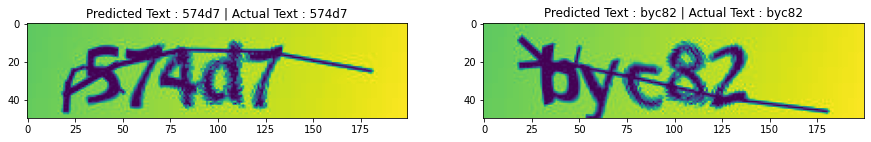

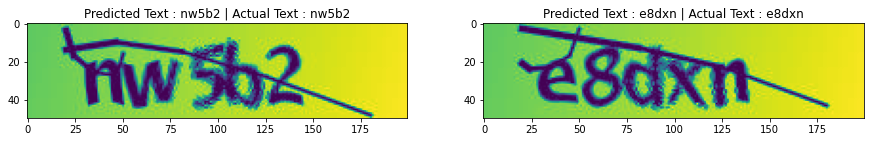

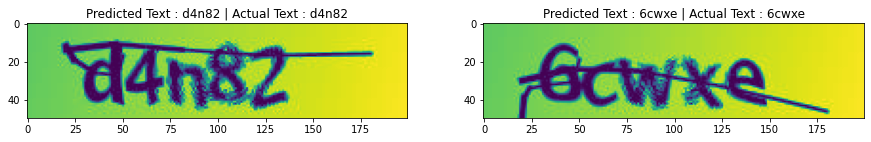

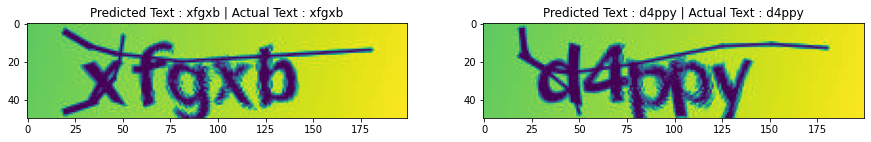

In [ ]:
num = int(numTestingSamples/2)

for i in range(0, num):
  fig, axs = plt.subplots(1, 2, figsize=(15,15))
  axs[0].imshow(np.reshape(X_test[2*i],(50,200)))
  axs[0].set_title(f'Predicted Text : {predictedCaptchaText[2*i]} | Actual Text : {testCaptchaText[2*i]}')
  axs[1].imshow(np.reshape(X_test[2*i + 1],(50,200)))
  axs[1].set_title(f'Predicted Text : {predictedCaptchaText[2*i + 1]} | Actual Text : {testCaptchaText[2*i + 1]}')